In [1]:
import matplotlib.pyplot as plt; import seaborn as sns; 
import numpy as np; import pandas as pd; import os;
from glob import glob

# Load the first (temporal) derivative of the pupillary response 

In [2]:
feature_path = os.path.join(os.path.expanduser('~'), 'Documents/elife_revisions_loki/pupil_features/')

In [3]:
pupil_deriv_data_path = os.path.join(os.path.expanduser('~'), 'Documents/elife_revisions_loki/pupil_deriv_data/')

In [4]:
pupil_files = glob(os.path.join(pupil_deriv_data_path, 'sub-*_ses-*_reward-*_pupil_deriv.csv'))

In [5]:
trunc_ideal_obs_df = pd.read_csv(os.path.join(os.path.expanduser('~'),'Documents/elife_revisions_loki/ls_reward_df.csv'))

In [6]:
n_sub = 4
n_sessions_per_sub = 9 

n_total_sessions = n_sub * n_sessions_per_sub

In [7]:
assert len(pupil_files) == n_total_sessions, 'check pupil files'

In [8]:
# assert len(ideal_obs_df.condition.unique()) == n_sessions_per_sub, 'check ideal obs. df'

In [9]:
pupil_dfs = [pd.read_csv(f) for f in pupil_files]

In [10]:
pupil_dfs[0].z_pupil_diameter_derivative1.isna().sum() / pupil_dfs[0].shape[0]

0.4995015055286427

In [33]:
# plt.plot(pupil_dfs[0].pupil_diameter)

In [12]:
pupil_df = pd.concat(pupil_dfs)

In [13]:
pupil_df.head()

,Unnamed: 0,raw_time,gaze_x,gaze_y,pupil_diameter,gaze_vel_x,gaze_vel_y,relative_time,trial_sample,trial_epoch,highpass_pupil_diameter,lowpass_pupil_diameter,z_pupil_diameter,z_pupil_diameter_derivative1,reward_code,session_n,subj_id
0,0,2554936.0,673.500000,477.299988,8189.0,4.530668,6.861076,10028.0,0,0,-0.483460,-307.607305,-0.044941,NaN,8530,1,786
1,1,2554937.0,673.900024,477.600006,8189.0,4.098997,7.006998,10029.0,1,0,-0.036687,-307.629140,-0.044974,-0.000032,8530,1,786
2,2,2554938.0,674.200012,477.600006,8189.0,3.667619,7.481402,10030.0,2,0,1.150432,-307.637545,-0.044986,-0.000012,8530,1,786
3,3,2554939.0,674.299988,477.700012,8191.0,3.212305,8.028868,10031.0,3,0,2.883138,-307.632074,-0.044978,0.000008,8530,1,786
4,4,2554940.0,674.099976,477.899994,8193.0,2.804688,8.576311,10032.0,4,0,3.932722,-307.612286,-0.044949,0.000029,8530,1,786


In [20]:
pupil_df_pared = pupil_df.loc[pupil_df.trial_sample > 500]

In [25]:
pupil_df_pared['subj_id_anon'] = pupil_df_pared.subj_id.copy()
di = {787: '1', 789:'2', 788:'3', 786:'4'}
pupil_df_pared.subj_id_anon.replace(di, inplace=True)

<ipython-input-25-49cc199bcc19>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pupil_df_pared['subj_id_anon'] = pupil_df_pared.subj_id.copy()
/Users/i_67981492/anaconda3/lib/python3.8/site-packages/pandas/core/series.py:4563: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().replace(


In [26]:
pupil_df_pared.subj_id_anon.unique()

array(['4', '1', '3', '2'], dtype=object)

In [32]:
pupil_df_pared.subj_id_anon = pupil_df_pared.subj_id_anon.astype('category')

/Users/i_67981492/anaconda3/lib/python3.8/site-packages/pandas/core/generic.py:5168: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


In [43]:
pupil_df_pared.columns

Index(['Unnamed: 0', 'raw_time', 'gaze_x', 'gaze_y', 'pupil_diameter',
       'gaze_vel_x', 'gaze_vel_y', 'relative_time', 'trial_sample',
       'trial_epoch', 'highpass_pupil_diameter', 'lowpass_pupil_diameter',
       'z_pupil_diameter', 'z_pupil_diameter_derivative1', 'reward_code',
       'session_n', 'subj_id', 'subj_id_anon'],
      dtype='object')

In [ ]:
sns.set_context('paper', font_scale=1.5)
sns.lineplot(x='trial_sample', y='pupil_diameter', hue='reward_code', data=pupil_df_pared, n_boot=10)
plt.ylabel('Raw pupil diameter'); plt.xlabel('Trial sample'); plt.legend(title='Subject', loc='upper right')
sns.despine()
plt.savefig('raw_pupil_diameter.png')

In [ ]:
sns.set_context('paper', font_scale=1.5)
sns.lineplot(x='trial_sample', y='z_pupil_diameter_derivative1', hue='reward_code', data=pupil_df_pared, n_boot=10)
plt.ylabel('Derivative of pupil diameter'); plt.xlabel('Trial sample'); plt.legend(title='Subject', loc='upper right')
sns.despine()
plt.savefig('deriv_pupil_diameter.png')

In [11]:
pupil_dfs[0].groupby(['trial_epoch'])['z_pupil_diameter_derivative1'].mean()

trial_epoch
0      0.000890
1     -0.000073
2     -0.000304
3     -0.000538
4     -0.000145
         ...   
393         NaN
394         NaN
395         NaN
396         NaN
397         NaN
Name: z_pupil_diameter_derivative1, Length: 398, dtype: float64

In [ ]:
# group by sub & plot average pupil derivative 


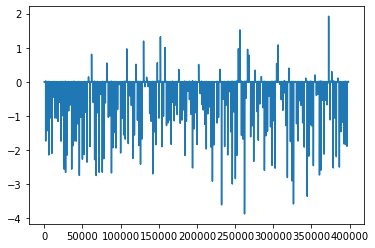

In [22]:
plt.plot(pupil_dfs[0].z_pupil_diameter_derivative1)

In [11]:
baseline_interval = 500

for df in pupil_dfs:
    df['trial_sample_shift'] = df.trial_sample - baseline_interval 
    df.drop(columns='Unnamed: 0', inplace=True)

# Compute features of the trial-evoked pupillary response 
* peak amplitude
* latency to peak amplitude
* peak onset
* peak offset
* peak width
* auc 
* mean diameter

In [12]:
def calc_mean(samples, trial_end=1500, trial_begin=0):
    """Calculate mean pupil diameter within a time interval. 
    The default is the trial interval."""
    
    trial_samples = samples.loc[(samples.trial_sample_shift <= trial_end) & 
                      (samples.trial_sample_shift >= trial_begin)]
    trial_samples_reduced = trial_samples.z_pupil_diameter_derivative1.mean()
    
    return trial_samples_reduced

In [13]:
def find_peaks(samples, trial_end=1500, trial_begin=0, 
          peak_width_min=100, generous_curve_detection=False):
    """Find peak pupil diameter within a time interval. 
    The default is the trial interval and the default peak width is 100 ms at minimum.
    
    Returns peak_amplitude, peak_width, beginning and end of peak, and peak index.
    Note that the index is relative to the _onset_ of the trial / stimulus."""
    
    import scipy.signal

    trial_samples = samples.loc[(samples.trial_sample_shift <= trial_end) & 
                      (samples.trial_sample_shift >= trial_begin)]
    
    amplitudes = []
    
    try: 
        peak_idx, peak_properties = scipy.signal.find_peaks(trial_samples.z_pupil_diameter_derivative1, 
                                                                width=peak_width_min)
        

        amplitudes.append(trial_samples.z_pupil_diameter_derivative1.iloc[peak_idx].values) # get index of max amp. 
        max_amp_idx = np.where(amplitudes[0] == amplitudes[0].max())[0][0] # idx of max amplitude peak properties

        peak_idx_fin = peak_idx[max_amp_idx] # data idx of max amp. peak

        peak_amplitude = trial_samples.z_pupil_diameter_derivative1.iloc[peak_idx_fin]

        if peak_amplitude.size == 0: 
            peak_amplitude = np.nan 

        if peak_properties['widths'].size == 0:
            peak_width = np.nan
        else:
            peak_width = peak_properties['widths'][max_amp_idx]

        # find beginning and end of curve 
        # note that this is fairly conservative (large window)
        if generous_curve_detection:
            peak_begin = peak_properties['left_bases'][max_amp_idx]
            peak_end = peak_properties['right_bases'][max_amp_idx]
        else:
        #     # if a tighter window is required, then can assume a symmetrical curve
        #     # and use the peak width + peak amplitude to find beginning and end of curve
            peak_end = peak_idx_fin + (peak_width/2)
            peak_begin = peak_idx_fin - (peak_width/2)

            if peak_end > trial_end:
                peak_end = trial_end


        if peak_idx.size == 0:
            peak_end = np.nan 
            peak_begin = np.nan 
            peak_idx = np.nan
        else:
            peak_idx = peak_idx[max_amp_idx]
            
    except:
        peak_properties = np.nan
        peak_amplitude = np.nan 
        peak_width = np.nan
        peak_end = np.nan 
        peak_begin = np.nan 
        peak_idx = np.nan

    return peak_properties, peak_amplitude, peak_width, peak_begin, peak_end, peak_idx

In [14]:
def latency_peak_onset_offset(peak_begin, peak_end):
    """Find latency (time in samples / ms) to peak onset (curve initiation). 
    Because the peak-finding function above is defined in terms of trial-relative time (0-1500 ms), 
    this is simply the index of the peak amplitude. 
    Separated from above for functional clarity."""
    
    return np.int(peak_begin), np.int(peak_end) # cast as int for indexing purposes

In [15]:
def latency_peak_amplitude(peak_idx):
    """Find latency (time in samples / ms) to peak amplitude of pupil diameter. 
    Because the above is defined in terms of trial-relative time (0-1500 ms), 
    this is simply the index of the peak amplitude. 
    Separated from above for functional clarity."""
    
    return np.int(peak_idx) # cast as int for indexing purposes

In [16]:
def find_auc(samples, peak_begin, peak_end, trial_begin=0, trial_end=1500):
    """Finds area under the curve of the phasic pupillary response using 
    trapezoidal integration."""
    
    trial_samples=samples.loc[(samples.trial_sample_shift <= trial_end) & 
                              (samples.trial_sample_shift >= trial_begin)]    
    
    peak_data = trial_samples.iloc[peak_begin:peak_end].z_pupil_diameter_derivative1
    
    auc = np.trapz(peak_data)
    
    return auc

In [17]:
trial_begin = 0; trial_len = 1500

786_8530_features.csv


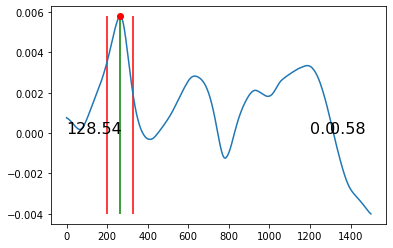

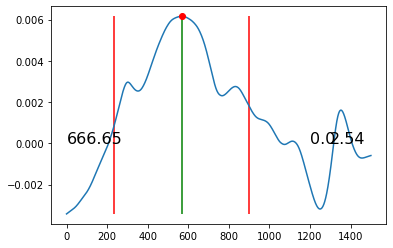

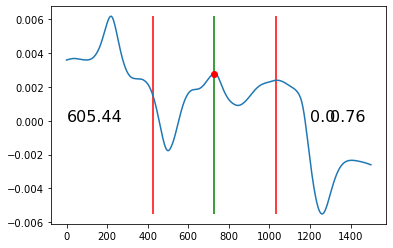

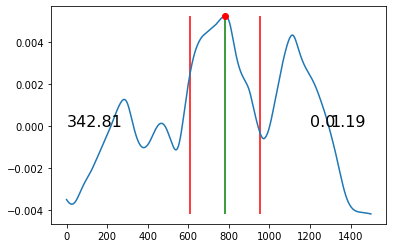

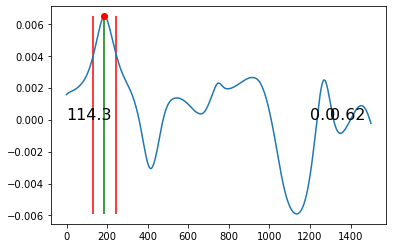

...

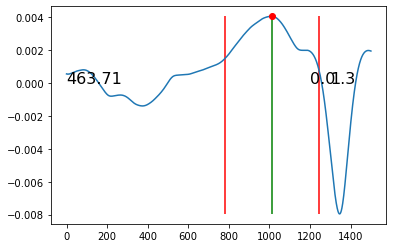

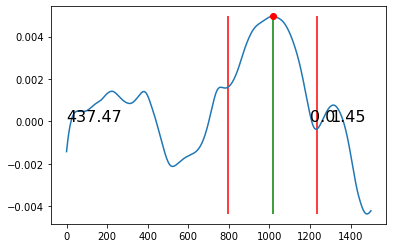

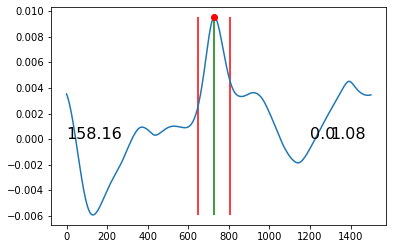

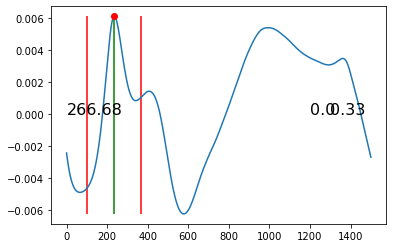

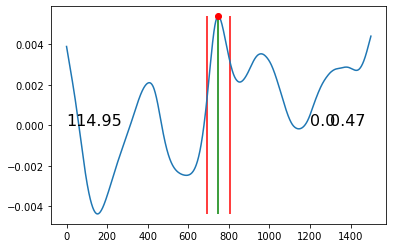

787_8530_features.csv


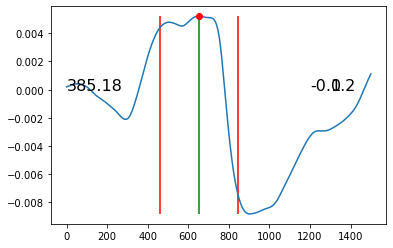

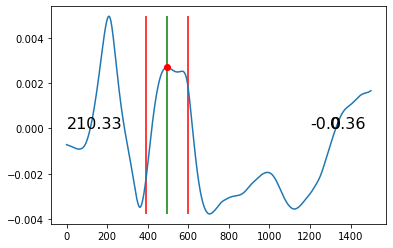

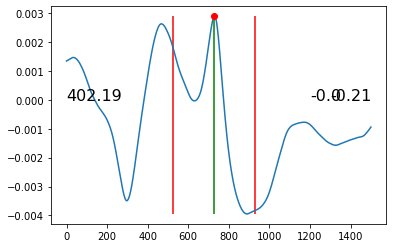

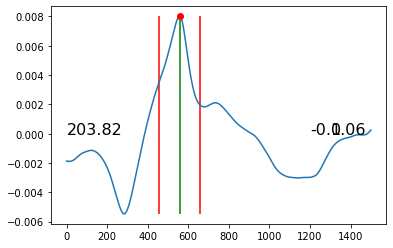

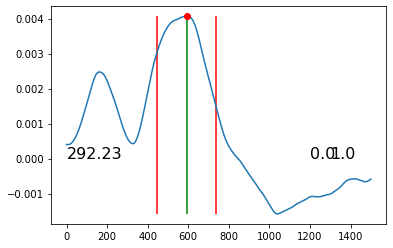

...

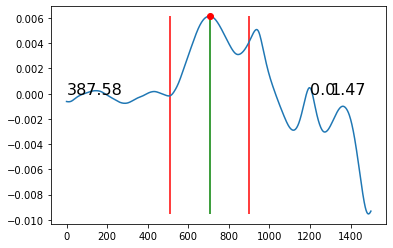

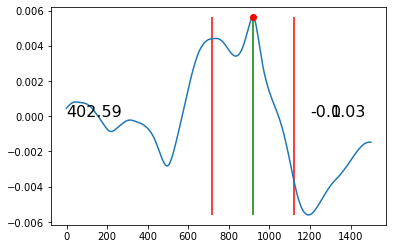

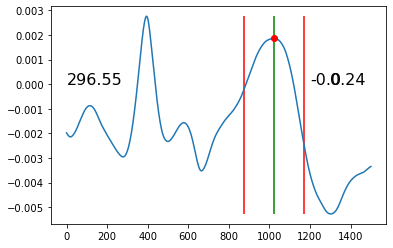

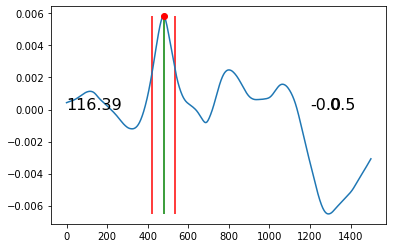

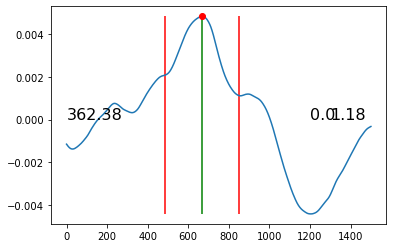

KeyboardInterrupt: 

In [19]:


for df in pupil_dfs:
    
    feature_df = pd.DataFrame()
    fn = (str(df.subj_id.unique()[0]) + '_' + str(df.reward_code.unique()[0]) + 
    '_features.csv')
    print(fn)


    peak_amplitudes = []
    peak_widths = []
    peak_onsets = []
    peak_offsets = []
    peak_amp_latencies = []
    aucs = []
    pd_means = []
    trials = []

    for trial in df.trial_epoch.unique():
        
        trials.append(trial)

        trial_data = df.loc[(df.trial_epoch == trial) & (df.trial_sample_shift >= trial_begin) 
                            & (df.trial_sample_shift <= trial_len)]
    

        (peak_properties, peak_amplitude, peak_width, peak_begin, peak_end, peak_idx) = find_peaks(trial_data)
        peak_amplitudes.append(peak_amplitude)
        peak_widths.append(peak_width)
        
        pd_mean = calc_mean(trial_data)  
        pd_means.append(pd_mean)


        if peak_amplitude is not np.nan: 

            peak_begin, peak_end = latency_peak_onset_offset(peak_begin, peak_end)
            peak_amp_latency = latency_peak_amplitude(peak_idx)

            peak_amp_latencies.append(peak_amp_latency)
            peak_onsets.append(peak_begin)
            peak_offsets.append(peak_end)

            auc = find_auc(trial_data, peak_begin, peak_end)
            aucs.append(auc)
        else:
            peak_onsets.append(np.nan)
            peak_offsets.append(np.nan)
            peak_amp_latencies.append(np.nan)
            aucs.append(np.nan)

        if peak_amplitude is not np.nan: 
            plt.figure()
            plt.plot(trial_data.trial_sample_shift, trial_data.z_pupil_diameter_derivative1)
            plt.plot(trial_data.trial_sample_shift.iloc[peak_idx], 
                     peak_amplitude, 'ro')

            plt.vlines([trial_data.trial_sample_shift.iloc[peak_begin],
                trial_data.trial_sample_shift.iloc[peak_end]], color='red', 
               ymin=trial_data.z_pupil_diameter_derivative1.min(),
               ymax=trial_data.z_pupil_diameter_derivative1.max())

            plt.vlines(trial_data.trial_sample_shift.iloc[peak_amp_latency], color='green',
               ymin=trial_data.z_pupil_diameter_derivative1.min(),
               ymax=trial_data.z_pupil_diameter_derivative1.max())
            

            plt.text(0,0, np.round(peak_width,2), fontsize=16)
            plt.text(1300,0, np.round(auc,2), fontsize=16)
            plt.text(1200,0, np.round(pd_mean,2), fontsize=16)
            
            plt.show()

    feature_df['trial'] = trials
    feature_df['peak_amp'] = peak_amplitudes
    feature_df['auc'] = aucs
    feature_df['peak_onset'] = peak_onsets
    feature_df['peak_offset'] = peak_offsets

    feature_df['peak_amp_latency'] = peak_amp_latencies
    feature_df['peak_width'] = peak_widths
    feature_df['pd_mean'] = pd_means

    feature_df['subj_id'] = df.subj_id.unique()[0]
    
    feature_df['reward_code'] = df.reward_code.unique()[0]


    feature_df.to_csv(os.path.join(feature_path, fn), index=False)

# Changepoint-evoked plot of each feature by condition

In [444]:
feature_fn = ('*_features.csv')
feature_files = glob(os.path.join(feature_path, feature_fn))
assert len(feature_files) == 36, 'check feature files'
feature_dfs = [pd.read_csv(file) for file in feature_files]

In [445]:
feature_dfs[0].columns

Index(['trial', 'peak_amp', 'auc', 'peak_onset', 'peak_offset',
       'peak_amp_latency', 'peak_width', 'pd_mean', 'subj_id', 'reward_code'],
      dtype='object')

In [446]:
feature_dfs[0].head()

,trial,peak_amp,auc,peak_onset,peak_offset,peak_amp_latency,peak_width,pd_mean,subj_id,reward_code
0,0,0.005209,1.202765,459.0,844.0,652.0,385.183674,-0.001261,787,8530
1,1,0.002690,0.364607,390.0,601.0,496.0,210.330735,-0.000770,787,8530
2,2,0.002889,-0.213639,527.0,930.0,729.0,402.188933,-0.000747,787,8530
3,3,0.008017,1.060726,455.0,658.0,557.0,203.823528,-0.000226,787,8530
4,4,0.004067,0.995725,445.0,738.0,592.0,292.234705,0.000714,787,8530


In [419]:
ideal_obs_df.head()

,cpp,b_t0,b_t1,MC,H,signed_B_diff,ideal_B,lambda_val,p_optimal,trial,...,p_id_solution,id_choice,stim_duration,stim_onset,stim_offset,abs_response_time,epoch_length,epoch_trial,epoch_number,shifted_epoch_trial
0,0.076938,1.038488,3.199304,0.383517,0.0975,0.000000,-2.160816,10.0,0.65,1,...,102.0,102.0,1.499901,10.694065,12.193966,11.168357,14.0,1.0,0.0,1.0
1,0.319389,1.073995,2.636439,0.604624,0.0975,2.160816,-1.562444,10.0,0.65,2,...,102.0,102.0,1.499189,17.007908,18.507097,17.508012,14.0,2.0,0.0,2.0
2,0.300755,1.210057,1.084931,0.467104,0.0975,1.562444,0.125126,10.0,0.65,3,...,102.0,102.0,1.499536,23.021708,24.521244,23.555879,14.0,3.0,0.0,3.0
3,0.365146,1.297258,2.998052,0.489297,0.0975,-0.125126,-1.700794,10.0,0.65,4,...,102.0,109.0,1.499888,29.218555,30.718443,29.863544,14.0,4.0,0.0,4.0
4,0.074485,1.371289,0.931292,0.456994,0.0975,1.700794,0.439997,10.0,0.65,5,...,102.0,102.0,1.499449,35.266001,36.765450,35.733463,14.0,5.0,0.0,5.0


In [447]:
for feature_df in feature_dfs:
    
    feature_df['condition'] = feature_df.reward_code.copy()
    
    feature_df.reward_code = feature_df['reward_code'].map(cond_code_mapping)

In [448]:
feature_ideal_dfs =[]

for feature_df in feature_dfs:

    s, reward_code = feature_df.subj_id.unique()[0], feature_df.reward_code.unique()[0]
        
    sub_ideal_obs = trunc_ideal_obs_df.loc[(trunc_ideal_obs_df.subj_id == s )& 
                                           (trunc_ideal_obs_df.reward_code == reward_code)].reset_index(drop=True)
    
    feature_ideal_df = pd.concat([sub_ideal_obs, feature_df], axis=1)
    feature_ideal_df = feature_ideal_df.loc[:,~feature_ideal_df.columns.duplicated()]
    
    feature_ideal_dfs.append(feature_ideal_df)
                                       

In [449]:
feature_ideal_df_all = pd.concat(feature_ideal_dfs) 

In [450]:
feature_ideal_df_all.head()

,cpp,b_t0,b_t1,MC,H,signed_B_diff,ideal_B,lambda_val,p_optimal,trial,...,epoch_trial,epoch_number,shifted_epoch_trial,peak_amp,auc,peak_onset,peak_offset,peak_amp_latency,peak_width,pd_mean
0,0.020965,0.036055,0.000000,0.661368,0.0375,0.000000,0.036055,30.0,0.85,1,...,1.0,0.0,1.0,0.005209,1.202765,459.0,844.0,652.0,385.183674,-0.001261
1,0.083027,0.066747,0.000000,0.739373,0.0375,-0.036055,0.066747,30.0,0.85,2,...,2.0,0.0,2.0,0.002690,0.364607,390.0,601.0,496.0,210.330735,-0.000770
2,0.023894,0.185745,0.648107,0.670867,0.0375,-0.066747,-0.462362,30.0,0.85,3,...,3.0,0.0,3.0,0.002889,-0.213639,527.0,930.0,729.0,402.188933,-0.000747
3,0.021170,0.217149,0.424404,0.740975,0.0375,0.462362,-0.207256,30.0,0.85,4,...,4.0,0.0,4.0,0.008017,1.060726,455.0,658.0,557.0,203.823528,-0.000226
4,0.020013,0.244306,0.307816,0.783233,0.0375,0.207256,-0.063510,30.0,0.85,5,...,5.0,0.0,5.0,0.004067,0.995725,445.0,738.0,592.0,292.234705,0.000714


In [452]:
# feature_ideal_df_all.to_csv(os.path.join(os.path.expanduser('~'),
#                                          'Documents/elife_revisions_loki/', 
#                                          'pupil_feature_ideal_obs_df.csv'), index=False)

In [455]:
feature_ideal_df_all.columns

Index(['cpp', 'b_t0', 'b_t1', 'MC', 'H', 'signed_B_diff', 'ideal_B',
       'lambda_val', 'p_optimal', 'trial', 'subj_id', 'reward_code',
       'condition', 'run', 'LR_choice', 'value_accuracy', 'value_LR_solution',
       'reward', 'cumulative_reward', 'rt', 'total_trial_time', 'iti',
       'cp_list', 'obs_cp_list', 'high_val_cue', 'high_p_cue', 'p_accuracy',
       'p_LR_solution', 'p_id_solution', 'id_choice', 'stim_duration',
       'stim_onset', 'stim_offset', 'abs_response_time', 'epoch_length',
       'epoch_trial', 'epoch_number', 'shifted_epoch_trial', 'peak_amp', 'auc',
       'peak_onset', 'peak_offset', 'peak_amp_latency', 'peak_width',
       'pd_mean'],
      dtype='object')

In [456]:
# feature_ideal_df_all_pared = feature_ideal_df_all.drop(columns = ['subj_id', 
#                                                                   'condition', 'reward_code', 
#                                                                   'trial', 'epoch_trial',
#                                                                  'accuracy', 'target_choice',
#                                                                  'correct_target_choice',
#                                                                  'lambda_val', 'p_optimal', 'H',
#                                                                  'b_t0', 'b_t1'])
# g = sns.pairplot(feature_ideal_df_all_pared)
# g.savefig(os.path.join(os.path.expanduser('~'),'Documents/elife_revisions_loki/', 'pupil_feature_ideal_obs_corr.pdf'))

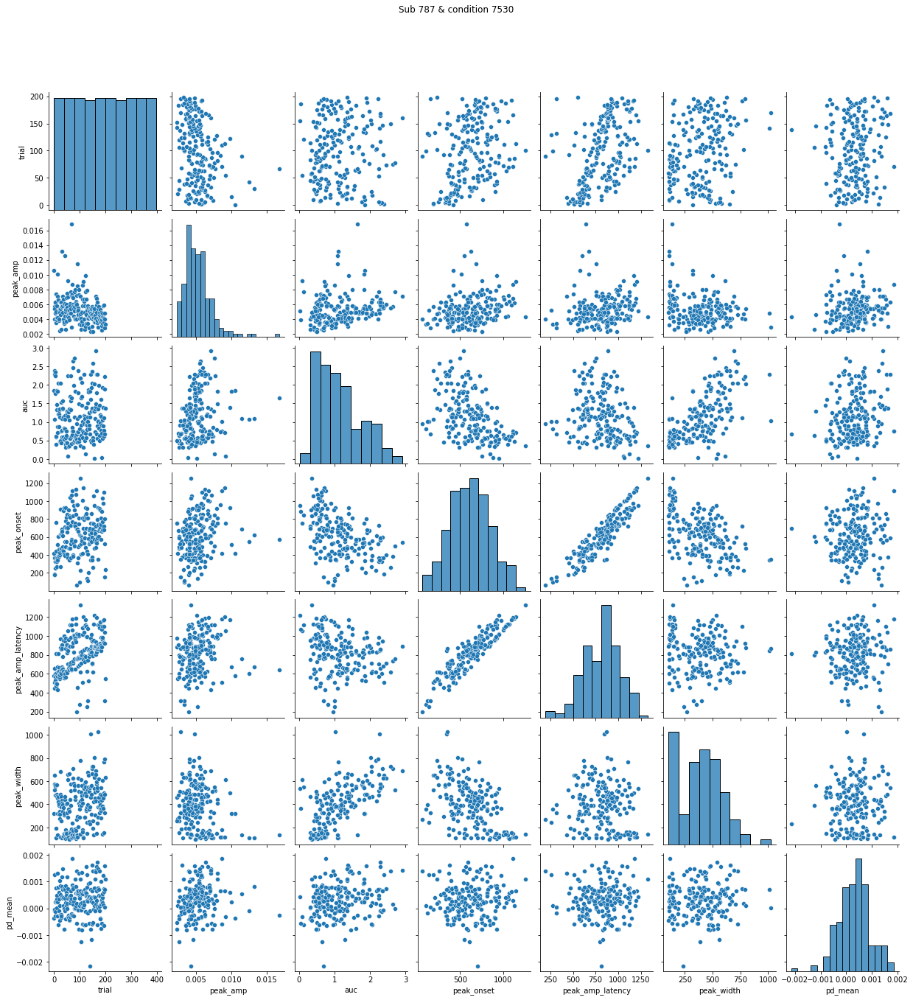

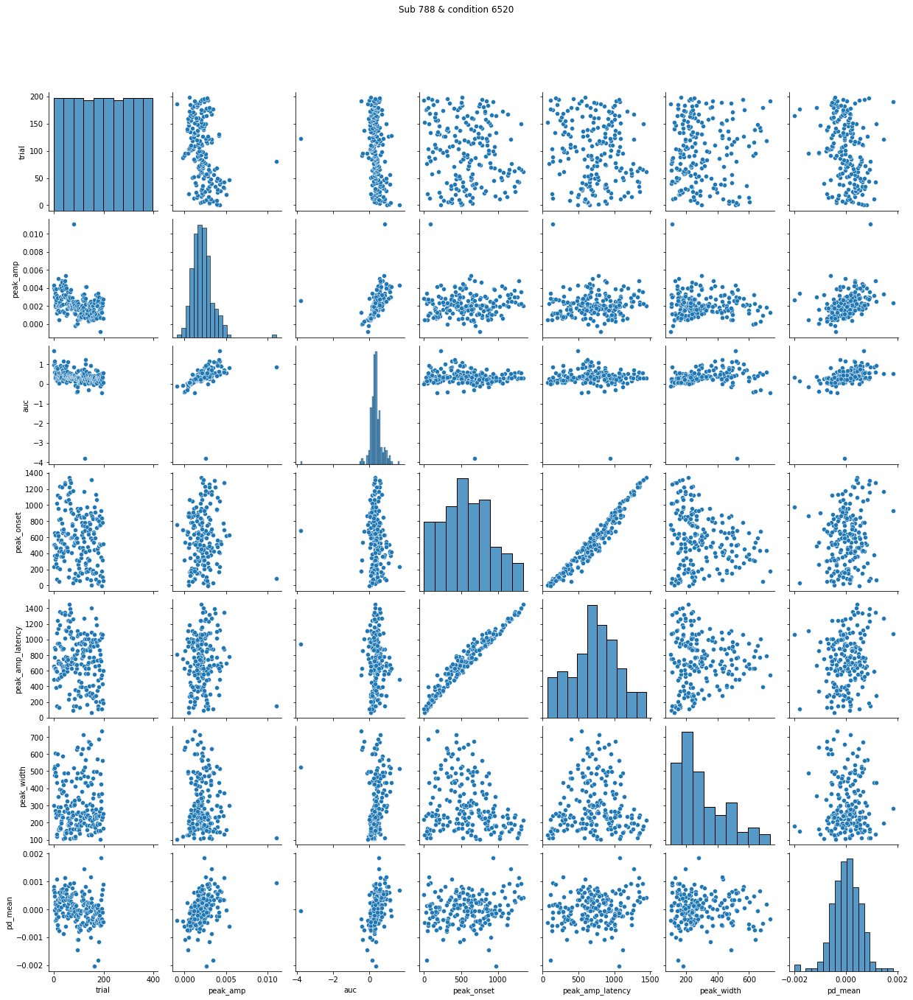

Error in callback <function flush_figures at 0x7fa6d84ffaf0> (for post_execute):


KeyboardInterrupt: 

In [316]:
for df in feature_dfs:
    
    
    subj_id = df.subj_id.unique()[0]
    reward_code = df.reward_code.unique()[0]
    fn = ('{}_{}_pupil_feature_correlations.pdf'.format(subj_id, reward_code))

    data_df = df.drop(columns = ['subj_id', 'reward_code'])
    

    g = sns.pairplot(data_df, kind="scatter")
    g.fig.suptitle('Sub {} & condition {}'.format(subj_id, reward_code), y=1.08)
    g.savefig(os.path.join(os.path.expanduser('~'),'Documents/elife_revisions_loki/pupil_feature_correlations', fn))

In [462]:
feature_ideal_df_all.groupby(['subj_id', 'reward_code', 'shifted_epoch_trial']).count()

cpp  b_t0  b_t1  MC   H  \
subj_id reward_code shifted_epoch_trial                            
786     0           -3.0                  38    38    38  38  38   
                    -2.0                  38    38    38  38  38   
                    -1.0                  38    38    38  38  38   
                     0.0                  37    37    37  37  37   
                     1.0                  38    38    38  38  38   
...                                      ...   ...   ...  ..  ..   
789     8            29.0                  3     3     3   3   3   
                     30.0                  1     1     1   1   1   
                     31.0                  1     1     1   1   1   
                     32.0                  1     1     1   1   1   
                     33.0                  1     1     1   1   1   

                                         signed_B_diff  ideal_B  lambda_val  \
subj_id reward_code shifted_epoch_trial                                       
786     0           -3.0                            38       38          38   
                    -2.0                            38       38          38   
                    -1.0                            38       38          38   
                     0.0                            37       37          37   
                     1.0                            38       38          38   
...                                                ...      ...         ...   
789     8            29.0                            3        3           3   
                     30.0                            1        1           1   
                     31.0                            1        1           1   
                     32.0                            1        1           1   
                     33.0                            1        1           1   

                                         p_optimal  trial  ...  epoch_length  \
subj_id reward_code shifted_epoch_trial                    ...                 
786     0           -3.0                        38     38  ...            38   
                    -2.0                        38     38  ...            38   
                    -1.0                        38     38  ...            38   
                     0.0                        37     37  ...            37   
                     1.0                        38     38  ...            38   
...                                            ...    ...  ...           ...   
789     8            29.0                        3      3  ...             3   
                     30.0                        1      1  ...             1   
                     31.0                        1      1  ...             1   
                     32.0                        1      1  ...             1   
                     33.0                        1      1  ...             1   

                                         epoch_trial  epoch_number  peak_amp  \
subj_id reward_code shifted_epoch_trial                                        
786     0           -3.0                          38            38        19   
                    -2.0                          38            38        18   
                    -1.0                          38            38        18   
                     0.0                          37            37        18   
                     1.0                          38            38        19   
...                                              ...           ...       ...   
789     8            29.0                          3             3         1   
                     30.0                          1             1         1   
                     31.0                          1             1         1   
                     32.0                          1             1         1   
                     33.0                          1             1         1   

                                         auc  

In [660]:
features = ['peak_amp', 'auc', 'peak_onset', 'peak_amp_latency', 'peak_width',
       'pd_mean', 'peak_offset']
print(features)

['peak_amp', 'auc', 'peak_onset', 'peak_amp_latency', 'peak_width', 'pd_mean', 'peak_offset']


In [463]:
feature_ideal_df_subset = feature_ideal_df_all.loc[feature_ideal_df_all.shifted_epoch_trial < 9]

<AxesSubplot:xlabel='shifted_epoch_trial', ylabel='pd_mean'>

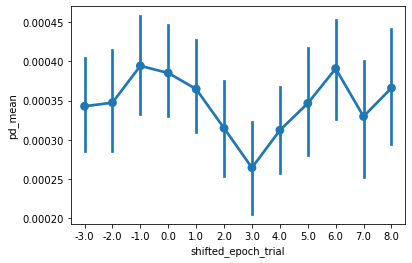

In [471]:
sns.pointplot(x='shifted_epoch_trial', y='pd_mean', data=feature_ideal_df_subset,
             estimator=np.nanmean)

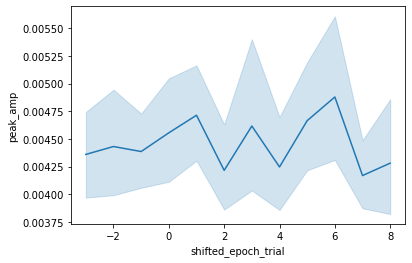

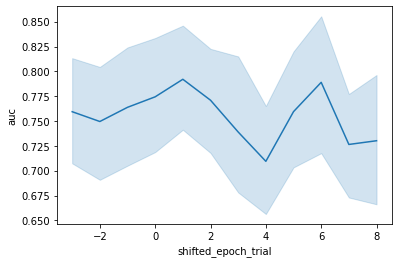

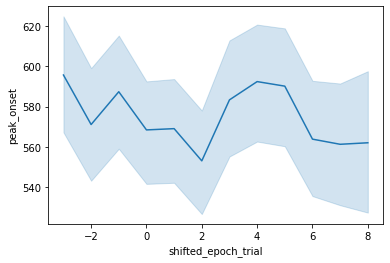

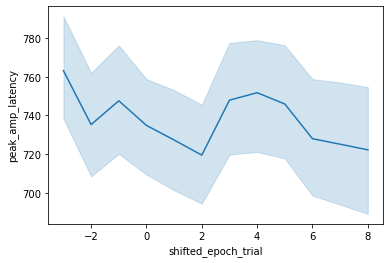

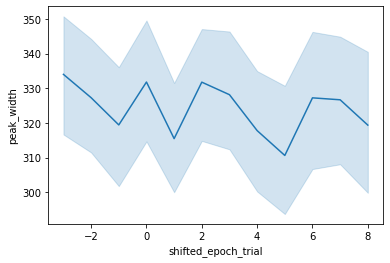

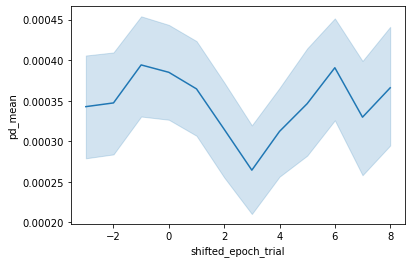

In [474]:
for feature in features: 

    plt.figure()
    sns.lineplot(x='shifted_epoch_trial', y=feature, 
                 data=feature_ideal_df_subset,  
                 estimator=np.nanmean)

# PCA

In [478]:
def verify_pc_independence(pca_projection):

    print('verifying pc independence')

    print(pca_projection.shape)

    pc_df = pd.DataFrame(pca_projection)
    pc_corr_matrix = pc_df.corr('spearman')

    print('pc_corr_matrix', pc_corr_matrix)


    return pc_corr_matrix

In [522]:
def plot_cumulative_explained_var_ratio(pca_obj, subj_id, reward_code, tag, variance_criterion=0.95,
):
    """Plot the cumulative variance explained as principal components are added."""


    fig_name = (str(subj_id) + '_' + str(reward_code) + '_cum_var_ratio_' + str(tag))

    cum_var_explained = np.cumsum(pca_obj.explained_variance_ratio_)
    min_n_components = np.min(np.where(cum_var_explained >= variance_criterion)) + 1

    plt.ioff()
    plt.figure()
    plt.title(fig_name, fontsize=20)
    plt.plot(np.arange(1, len(cum_var_explained)+1), cum_var_explained, '.-')
    plt.plot(min_n_components, cum_var_explained[min_n_components-1], 'ro')
    plt.xlabel('number of components')
    plt.ylabel('cumulative explained variance')
    plt.ylim([0.5, 1])
    plt.savefig(os.path.join(pupil_metric_fig_path, fig_name + '.png'))
    plt.close()

    return min_n_components, cum_var_explained


def plot_eigenvectors(pca_obj, feature_df, subj_id, reward_code,
pupil_metric_fig_path=os.path.join(os.path.expanduser('~'),
'Dropbox/loki_0.5/figures/pupil_pca/')):
    """Plot the magnitude of the eigenvector for each principal component."""

    abs_pca_comps = abs(pca_obj.components_) # [n_components, n_features]
    n_components, n_features = abs_pca_comps.shape[0], abs_pca_comps.shape[1]

    for component in range(n_components):
        fig_name = (str(subj_id) + '_' + str(reward_code) + '_pc' +
        str(component) + '_feature_importance')

        plt.ioff()
        plt.figure()
        plt.title(fig_name, fontsize=20)
        plt.bar(np.arange(0,n_features), abs_pca_comps[component, :]) # for PC_n, feature importance
        plt.xticks(np.arange(0, n_features), labels=feature_df.columns, fontsize=15,
                  rotation=45)
        plt.ylabel('feature importance (eigenvector value)', fontsize=15)
        plt.savefig(os.path.join(pupil_metric_fig_path, fig_name + '.png'))
        plt.close()

    return abs_pca_comps, n_components, n_features

def calc_loadings(pca_obj, feature_df, subj_id, reward_code,
pupil_metric_fig_path=os.path.join(os.path.expanduser('~'),
'Dropbox/loki_0.5/figures/pupil_pca/')):
    """Calculate the loadings for each principal component."""

    loadings = pca_obj.components_.T * np.sqrt(pca_obj.explained_variance_) # loadings = V {eigenvector} * sqrt(E) {eigenvalue}

    return loadings

def pc_df(abs_pca_components):
    pc = [abs_pca_components[session][component] for session in range(len(abs_pca_components))]
    pc_df = pd.DataFrame(pc)
    pc_df_melted = pd.melt(pc_df, var_name='feature', value_name='abs_pca_comp')

    return pc_df_melted

In [523]:
feature_ideal_df_all_pared = feature_ideal_df_all[['peak_amp', 'auc', 'peak_onset', 'peak_offset', 'peak_amp_latency', 'peak_width',
       'pd_mean']]

In [524]:
variance_criterion = 0.95

In [538]:
min_n_components_list = []
cum_var_explained_list = []
subjects = []
reward_codes = []

for sub in feature_ideal_df_all.subj_id.unique():
    
    
    for r in feature_ideal_df_all.reward_code.unique():
        
        subjects.append(sub)
        reward_codes.append(r)
            
        sub_data = feature_ideal_df_all.loc[(feature_ideal_df_all.subj_id == s) &
                                            (feature_ideal_df_all.reward_code == r)]
        
        sub_data_pared = sub_data[['peak_amp', 'auc', 'peak_onset', 'peak_offset',
                                   'peak_amp_latency', 'peak_width',
       'pd_mean']]
        
        pca_obj, pca_projection, interp_feature_df = pca(sub_data_pared)
        cum_var_explained = np.cumsum(pca_obj.explained_variance_ratio_)
        min_n_components = np.min(np.where(cum_var_explained >= variance_criterion)) + 1
        
        min_n_components_list.append(min_n_components)
        cum_var_explained_list.append(cum_var_explained)

mean scaled X  -0.0 std scaled X  1.0
(398, 7)
(398, 7)
[[ 2.35453936e+00  3.85378825e-01 -1.94997583e+00  2.42067223e+00
  -1.36908911e-01 -1.69445551e-03 -2.68797840e-16]
 [ 4.15828403e+00 -1.70101913e+00 -6.84472071e-01  2.06247837e-01
   1.20672159e-01  1.65285138e-03 -2.59117414e-15]
 [ 1.48421581e+00 -2.02023907e+00 -2.04104747e+00  2.67552715e-01
   2.12739643e+00  2.61197849e-03  3.10852565e-15]
 [ 2.98505209e+00  9.65860099e-01  1.37856619e+00  1.33497238e+00
   1.05924582e-01 -3.82346702e-03  1.90851164e-15]
 [ 2.19077898e+00  1.13340579e+00  3.11826051e-01 -1.62298592e+00
  -2.42035948e-02  3.14020749e-03 -2.16904614e-16]]
mean scaled X  0.0 std scaled X  0.9999999999999999
(398, 7)
(398, 7)
[[ 1.73943200e+00  1.64301812e+00 -1.43341628e+00 -2.26352378e+00
   6.52738333e-02  7.13914381e-03  3.03400617e-04]
 [ 3.52771110e+00 -1.02100676e+00  7.67491580e-01 -4.55071626e-01
  -4.35285271e-01  4.68344300e-03  4.44911645e-05]
 [ 2.78521261e+00  5.73737437e-01 -1.14671051e+00 -1.0

mean scaled X  -0.0 std scaled X  1.0
(398, 7)
(398, 7)
[[ 4.58715296e+00 -3.32733702e+00 -6.28866877e-01 -6.51844581e-02
  -1.62398748e-01  5.53551103e-03 -1.64621706e-03]
 [ 2.75978282e+00 -1.30438374e+00  6.13314689e-01  1.48061455e-01
  -7.36860234e-02  5.53767414e-03 -1.64110634e-04]
 [ 2.02297122e+00  4.29238251e-01  7.43202218e-01  5.81538344e-01
   2.65839843e-01 -1.58858971e-03 -1.08667031e-03]
 [ 2.78247634e+00 -7.65731818e-01  1.70290245e+00  1.41947810e+00
   1.33017220e-01  1.06708821e-02  1.29060797e-03]
 [ 3.66554759e+00 -1.00021569e+00  1.72092311e+00  2.06852335e+00
   2.97671889e-01  7.41294881e-03 -1.39604982e-03]]
mean scaled X  0.0 std scaled X  1.0
(398, 7)
(398, 7)
[[ 2.76084685e+00 -1.48061029e+00  4.93500773e-02  1.40600221e+00
  -1.11423028e+00  3.39045962e-03 -1.48414408e-03]
 [ 1.96725250e-01  3.02068020e+00  9.45689769e-01 -1.03514424e+00
   1.74555333e-01  6.33111295e-04  1.27724732e-03]
 [ 1.13713613e+00 -4.91096239e-01  4.32996555e-01  1.42495331e+00
   

In [539]:
cum_var_explained_0 = pd.DataFrame(cum_var_explained_list)

In [540]:
cum_var_explained_0['subject'] = subjects
cum_var_explained_0['reward_code'] = reward_codes

In [545]:
cum_var_explained_0_melt = cum_var_explained_0.melt(id_vars = ['subject', 'reward_code'], var_name='PC', value_name='cum_var_explained')

<AxesSubplot:xlabel='PC', ylabel='cum_var_explained'>

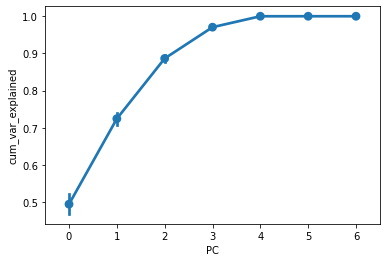

In [561]:
plt.figure()
sns.pointplot(x='PC', y='cum_var_explained', data=cum_var_explained_0_melt, units='subject')

In [562]:
n_components = 4

mean scaled X  -0.0 std scaled X  1.0
(398, 4)
(398, 7)
[[ 3.75017811  0.48694803 -0.01050632 -1.66681684]
 [ 0.01267069  4.17489835  0.10301594 -1.19088768]
 [-0.80420378  1.10719418 -0.81524171 -1.89194553]
 [-0.58595004  0.51650913 -0.89536406  0.2912053 ]
 [ 4.4100949   0.65785438 -1.10572109 -0.9178609 ]]
mean scaled X  0.0 std scaled X  0.9999999999999999
(398, 4)
(398, 7)
[[ 0.54391806  2.320062   -0.77014567 -0.49841617]
 [ 0.68420018  1.87883849  0.32673851  0.69439044]
 [ 0.74331545  1.44244541  0.5028055  -0.30381429]
 [ 1.18286183  1.92594783 -0.42237079 -0.31139515]
 [ 1.62961674  0.91418122 -0.64757336 -0.52626537]]
mean scaled X  -0.0 std scaled X  1.0
(398, 4)
(398, 7)
[[ 1.42633428 -0.26290722  0.69055215 -0.2155364 ]
 [ 1.09088565  0.17818042  0.33374029  0.7082298 ]
 [ 1.84562286  0.82326152  0.52641784 -0.61800209]
 [ 2.52054174  0.3057018   0.8193302  -0.90688455]
 [ 0.64973024  1.46484387 -1.74795524 -0.18752771]]
mean scaled X  0.0 std scaled X  1.0
(398, 4)
(398

<ipython-input-736-c51b81e75e4c>:49: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


mean scaled X  -0.0 std scaled X  1.0
(398, 4)
(398, 7)
[[ 1.16607858  3.2849798   0.54114706  0.72659248]
 [ 0.87885438  0.60753247 -0.80023042  0.01537535]
 [-4.0148954   1.90767785 -0.3074134  -0.19836424]
 [ 0.41053084  1.23213562 -1.48271634  0.91963736]
 [ 0.98655733  2.83828194 -0.84447469  0.23511351]]
mean scaled X  -0.0 std scaled X  1.0
(398, 4)
(398, 7)
[[ 1.29414213 -0.42489102  0.75102466 -0.53006486]
 [ 5.33075707 -2.32902267  1.10215297  0.90807074]
 [ 0.78960924  1.1163984   0.31445422  0.21192181]
 [ 1.49647929  2.40668777  4.07998096  0.10097014]
 [ 2.0017729   1.47931004  0.91228871 -0.62902036]]
mean scaled X  -0.0 std scaled X  1.0
(398, 4)
(398, 7)
[[ 2.58685753 -0.10445303 -0.79469793 -0.09292156]
 [ 2.32330693  0.55807264 -1.16918962  0.67611008]
 [ 3.18682758  0.12495864 -0.82473219 -0.01323737]
 [ 2.93631572  0.08817861 -0.63067512 -0.27382262]
 [ 2.47589269  0.06036514 -0.96475088 -0.15254543]]
mean scaled X  -0.0 std scaled X  1.0
(398, 4)
(398, 7)
[[ 3.750

mean scaled X  -0.0 std scaled X  1.0
(398, 4)
(398, 7)
[[ 1.16607858  3.2849798   0.54114706  0.72659248]
 [ 0.87885438  0.60753247 -0.80023042  0.01537535]
 [-4.0148954   1.90767785 -0.3074134  -0.19836424]
 [ 0.41053084  1.23213562 -1.48271634  0.91963736]
 [ 0.98655733  2.83828194 -0.84447469  0.23511351]]
mean scaled X  -0.0 std scaled X  1.0
(398, 4)
(398, 7)
[[ 1.29414213 -0.42489102  0.75102466 -0.53006486]
 [ 5.33075707 -2.32902267  1.10215297  0.90807074]
 [ 0.78960924  1.1163984   0.31445422  0.21192181]
 [ 1.49647929  2.40668777  4.07998096  0.10097014]
 [ 2.0017729   1.47931004  0.91228871 -0.62902036]]
mean scaled X  -0.0 std scaled X  1.0
(398, 4)
(398, 7)
[[ 2.58685753 -0.10445303 -0.79469793 -0.09292156]
 [ 2.32330693  0.55807264 -1.16918962  0.67611008]
 [ 3.18682758  0.12495864 -0.82473219 -0.01323737]
 [ 2.93631572  0.08817861 -0.63067512 -0.27382262]
 [ 2.47589269  0.06036514 -0.96475088 -0.15254543]]


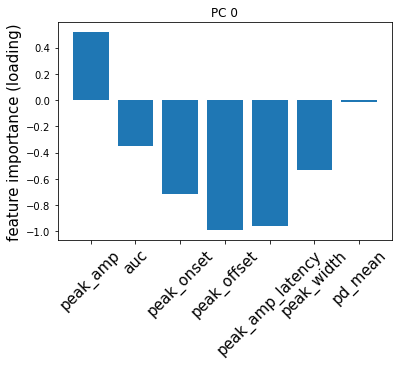

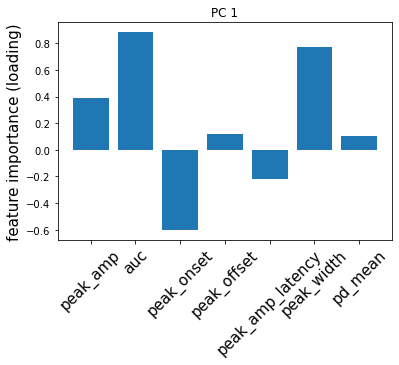

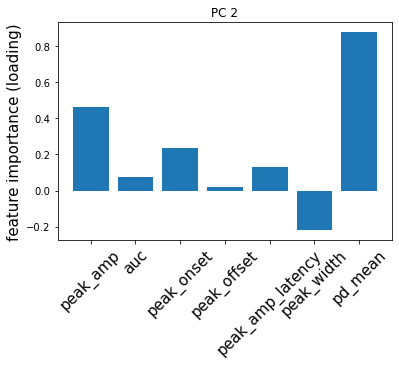

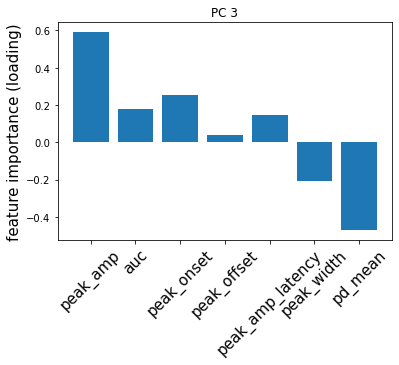

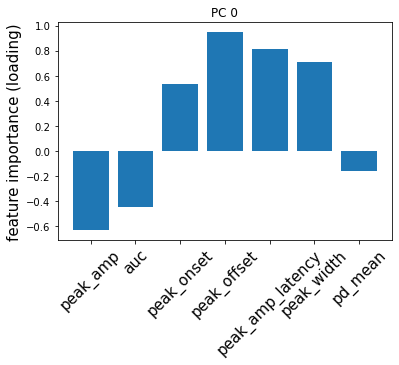

...

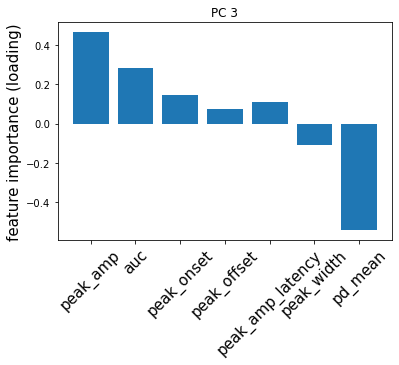

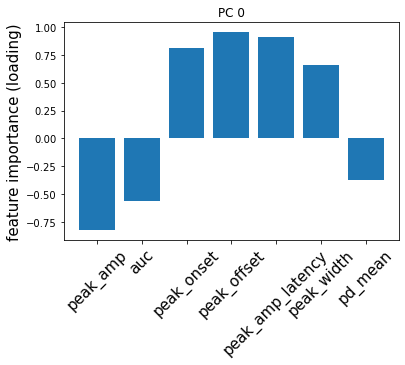

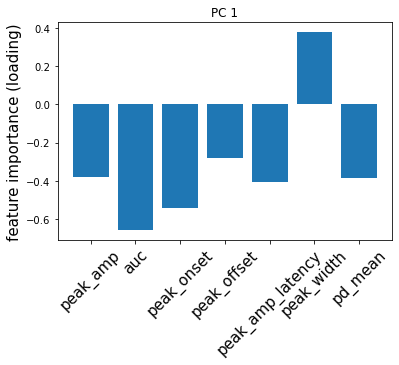

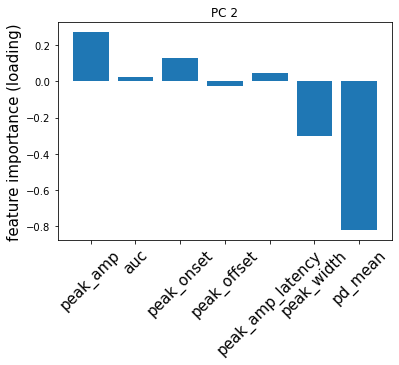

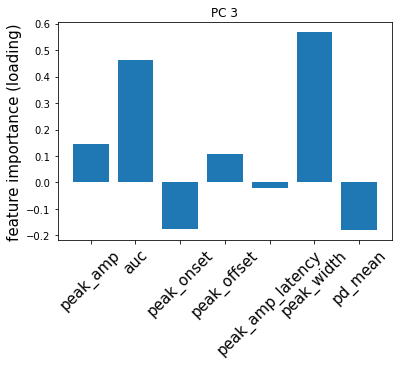

In [736]:
abs_pca_components_list = []
pca_projection_list = []
loadings_list = []
subjects = []
reward_codes = []
reward_code_single_list = []
sub_single_list = []

for sub in feature_ideal_df_all.subj_id.unique():
    
    sub_single_list.append(sub)
    
    for r in feature_ideal_df_all.reward_code.unique():
        
        reward_code_single_list.append(r)



        sub_data = feature_ideal_df_all.loc[(feature_ideal_df_all.subj_id == s) &
                                                (feature_ideal_df_all.reward_code == r)].reset_index(drop=True)
        
        sub_data_pared = sub_data[['peak_amp', 'auc', 'peak_onset', 'peak_offset',
                                   'peak_amp_latency', 'peak_width',
        'pd_mean']]

        pca_obj, pca_projection, interp_feature_df = pca(sub_data_pared, n_components=n_components)
        
        abs_pca_comps = abs(pca_obj.components_) # [n_components, n_features]
        n_components, n_features = abs_pca_comps.shape[0], abs_pca_comps.shape[1]
        loadings = pca_obj.components_.T * np.sqrt(pca_obj.explained_variance_) # loadings = V {eigenvector} * sqrt(E) {eigenvalue}

        loadings_list.append(loadings)
        abs_pca_components_list.append(abs_pca_comps)
        subjects.append([sub]*n_features)
        reward_codes.append([r]*n_features)
        pca_projection_list.append(pca_projection)
        
        PC_df = pd.DataFrame(pca_projection, columns=['PC0', 'PC1', 'PC2', 'PC3'])
        
        PC_feature_ideal_df = pd.concat([PC_df, sub_data])
        fn = '{}_reward{}_PC_ideal_feature_df.csv'.format(sub, r)
        PC_feature_ideal_df.to_csv(os.path.join(os.path.expanduser('~'),
                                                'Documents/elife_revisions_loki/', fn))
        
        for component in range(n_components):



            plt.figure()
            plt.title('PC {}'.format(component))
            plt.bar(np.arange(0,n_features), loadings[:, component]) # for PC_n, feature importance
            plt.xticks(np.arange(0, n_features), labels=sub_data_pared.columns, fontsize=15,
                      rotation=45)
            plt.ylabel('feature importance (loading)', fontsize=15)



In [740]:
sub_data

,cpp,b_t0,b_t1,MC,H,signed_B_diff,ideal_B,lambda_val,p_optimal,trial,...,epoch_trial,epoch_number,shifted_epoch_trial,peak_amp,auc,peak_onset,peak_offset,peak_amp_latency,peak_width,pd_mean
0,0.031318,0.977957,0.114097,0.626535,0.055,0.000000,0.863860,20.0,0.75,1,...,1.0,0.0,1.0,0.002764,0.527461,533.0,886.0,710.0,352.844636,0.000411
1,0.041131,0.994306,0.069247,0.717750,0.055,-0.863860,0.925059,20.0,0.75,2,...,2.0,0.0,2.0,0.001890,0.622458,376.0,825.0,601.0,449.038909,0.000392
2,0.168989,0.684310,0.128096,0.750830,0.055,-0.925059,0.556214,20.0,0.75,3,...,3.0,0.0,3.0,0.002073,0.417871,562.0,965.0,764.0,402.093474,0.000343
3,0.367085,1.537732,0.359932,0.560604,0.055,-0.556214,1.177799,20.0,0.75,4,...,4.0,0.0,4.0,0.002215,0.417469,562.0,915.0,739.0,353.169939,0.000313
4,0.117635,1.523881,2.411969,0.419496,0.055,-1.177799,-0.888088,20.0,0.75,5,...,5.0,0.0,5.0,0.002047,0.528774,500.0,849.0,675.0,349.867057,0.000455
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
393,0.043346,3.079635,0.788428,0.407649,0.055,-0.893456,2.291207,20.0,0.75,394,...,18.0,20.0,18.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
394,0.032702,3.011164,0.307470,0.619462,0.055,-2.291207,2.703694,20.0,0.75,395,...,19.0,20.0,19.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
395,0.045526,2.861706,0.346468,0.713021,0.055,-2.703694,2.515238,20.0,0.75,396,...,20.0,20.0,-3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
396,0.028756,3.223610,0.398984,0.741952,0.055,-2.515238,2.824627,20.0,0.75,397,...,21.0,20.0,-2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [743]:
pd.concat([PC_df, sub_data])

,PC0,PC1,PC2,PC3,cpp,b_t0,b_t1,MC,H,signed_B_diff,...,epoch_trial,epoch_number,shifted_epoch_trial,peak_amp,auc,peak_onset,peak_offset,peak_amp_latency,peak_width,pd_mean
0,2.586858,-0.104453,-0.794698,-0.092922,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2.323307,0.558073,-1.169190,0.676110,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3.186828,0.124959,-0.824732,-0.013237,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2.936316,0.088179,-0.630675,-0.273823,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2.475893,0.060365,-0.964751,-0.152545,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
393,NaN,NaN,NaN,NaN,0.043346,3.079635,0.788428,0.407649,0.055,-0.893456,...,18.0,20.0,18.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
394,NaN,NaN,NaN,NaN,0.032702,3.011164,0.307470,0.619462,0.055,-2.291207,...,19.0,20.0,19.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
395,NaN,NaN,NaN,NaN,0.045526,2.861706,0.346468,0.713021,0.055,-2.703694,...,20.0,20.0,-3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
396,NaN,NaN,NaN,NaN,0.028756,3.223610,0.398984,0.741952,0.055,-2.515238,...,21.0,20.0,-2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [727]:
feature_loadings_df = pd.DataFrame(np.concatenate(loadings_list))

In [728]:
flat_subjects = sum(subjects, [])
flat_reward_codes = sum(reward_codes,[])

In [729]:
feature_loadings_df['subject'] = flat_subjects
feature_loadings_df['reward_code'] = flat_reward_codes
feature_loadings_df['feature'] =  np.tile([range(n_features)], 36)[0]

In [730]:
feature_loadings_df_melt = feature_loadings_df.melt(id_vars=['subject', 'reward_code', 'feature'], var_name='PC', value_name='loading')

In [731]:
feature_code_mapping = dict(zip(range(0,8), features))

In [732]:
feature_code_mapping

{0: 'peak_amp',
 1: 'auc',
 2: 'peak_onset',
 3: 'peak_amp_latency',
 4: 'peak_width',
 5: 'pd_mean',
 6: 'peak_offset'}

In [733]:
feature_loadings_df_melt.feature = feature_loadings_df_melt['feature'].map(feature_code_mapping)

In [735]:
feature_loadings_df_melt.to_csv(os.path.join(os.path.expanduser('~'),
                                                'Documents/elife_revisions_loki/PCs', 'feature_loadings.csv'))

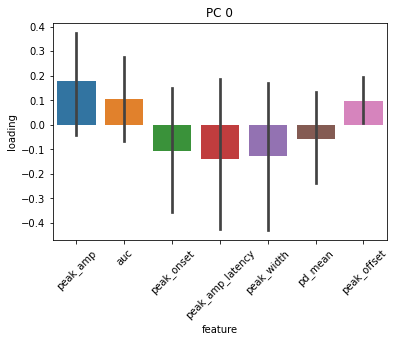

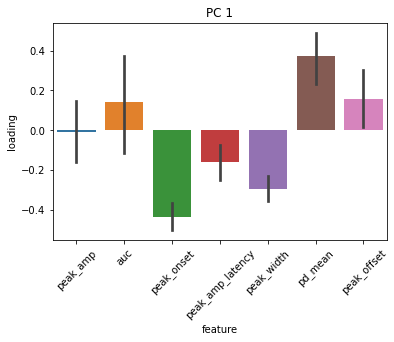

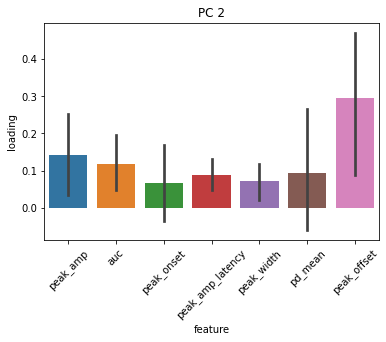

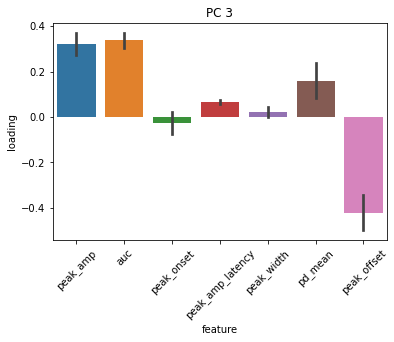

In [664]:
for PC in feature_loadings_df_melt.PC.unique():

    plt.figure()
    plt.title('PC {}'.format(PC))
    ax = sns.barplot(x='feature', y='loading', data=feature_loadings_df_melt.loc[feature_loadings_df_melt.PC == PC])
    ax.set_xticklabels(features, rotation=45)